## Cleaned group notebook
#### Transit desert group  
Our group tries to analyze the discrepancy between public transit needs and current public transit provisions in LA. This notebook contains important charts, maps and other coding material relevant for our final project.

#### Installing and importing required libraries

In [1]:
import pandas as pd
import geopandas as gpd
import matplotlib
import matplotlib.pyplot as plt
import folium
import numpy as np
import mapclassify

# for network analysis
import networkx as nx

# for street network analysis
import osmnx as ox

# for basemaps
import contextily as ctx

# to draw custom legend elements, import these libraries
from matplotlib.patches import Patch
from matplotlib.lines import Line2D
from matplotlib.colors import Normalize
from shapely.geometry import Point

#### Managing structural data

#### Importing "age" data

In [2]:
#load a data file and changing data type of FIPS into strings for leading zeros
df = pd.read_csv(
    'Data/US_Census_LA_County.csv',
    dtype=
    {
        'FIPS':str,
    }
)

/tmp/ipykernel_316/1449495791.py:2: DtypeWarning: Columns (294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,320,321,322) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(


In [3]:
#creating new dataframe including data to be used
columns_to_keep = ['FIPS',
                   'DP1_0024C',
                   'DP1_0024P',
                   ]
df2 = df[columns_to_keep]

In [4]:
#change the column names to common language
df2.columns = ['FIPS',
'Population Over 65',
'Percent_of_Population_Over_65',
]
df2.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2488 entries, 0 to 2487
Data columns (total 3 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   FIPS                           2488 non-null   object 
 1   Population Over 65             2488 non-null   int64  
 2   Percent_of_Population_Over_65  2488 non-null   float64
dtypes: float64(1), int64(1), object(1)
memory usage: 58.4+ KB


#### Importing public transit commuter data

In [5]:
#load another data file and changing data type of FIPS into strings for leading zeros
df3 = pd.read_csv(
    'Data/means_of_commute.csv',
    dtype=
    {
        'FIPS':str,
    }
)

/tmp/ipykernel_316/2832874606.py:2: DtypeWarning: Columns (5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,197,199,201,211,212,217,218,223,224,229,230,235,236,241,242,247,248,253,254,259,260,265,266,271,272,277,278,283,284,289,290,295,296,301,302,307,308,313,314,319,320,325,326,331,332,337,338,343,344,349,350,355,356,361,362,373,374,379,380,385,386,391,392,397,398,403,404,409,410,415,416,457,458,463,464,469,470,475,476,481,482,487,488,493,494,499,500,505,506,511,512,517,518,523,524,529,530

In [6]:
#creating new dataframe including data to be used
columns_to_keep2 = ['FIPS',
                   'S0802_C04_098E',]
df4 = df3[columns_to_keep2]

In [7]:
#change the column names to common language
df4.columns = ['FIPS',
'Percentage_of_Public_Transportation',]
df4.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2346 entries, 0 to 2345
Data columns (total 2 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   FIPS                                 2346 non-null   object 
 1   Percentage_of_Public_Transportation  2346 non-null   float64
dtypes: float64(1), object(1)
memory usage: 36.8+ KB


#### Importing car ownership data

In [8]:
#importing data of percentage without vehicle
tracts2=gpd.read_file('Data/Without_Vehicle.geojson')
tracts2.info(verbose=True, show_counts=True)

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 2495 entries, 0 to 2494
Data columns (total 11 columns):
 #   Column               Non-Null Count  Dtype   
---  ------               --------------  -----   
 0   tract                2495 non-null   object  
 1   no_vehicle           2495 non-null   int64   
 2   no_vehicle_universe  2495 non-null   int64   
 3   no_vehicle_pct       2471 non-null   float64 
 4   sup_dist             2495 non-null   object  
 5   csa                  2495 non-null   object  
 6   spa                  2495 non-null   object  
 7   ESRI_OID             2495 non-null   int64   
 8   Shape__Area          2495 non-null   float64 
 9   Shape__Length        2495 non-null   float64 
 10  geometry             2495 non-null   geometry
dtypes: float64(3), geometry(1), int64(3), object(4)
memory usage: 214.5+ KB


In [9]:
columns2 = list(tracts2)
columns2

['tract',
 'no_vehicle',
 'no_vehicle_universe',
 'no_vehicle_pct',
 'sup_dist',
 'csa',
 'spa',
 'ESRI_OID',
 'Shape__Area',
 'Shape__Length',
 'geometry']

In [10]:
tracts2.columns = ['FIPS',
 'no_vehicle',
 'no_vehicle_universe',
 'Percentage_of_Without_Vehicle',
 'sup_dist',
 'csa',
 'spa',
 'ESRI_OID',
 'Shape__Area',
 'Shape__Length',
 'geometry']

In [11]:
#creating new dataframe including data to be used
columns_to_keep3 = ['FIPS',
                   'Percentage_of_Without_Vehicle',
                   'geometry']
tracts3 = tracts2[columns_to_keep3]

#### Importing income data

In [12]:
incomedf=gpd.read_file('Data/Median_Income_and_AMI_(census_tract).geojson')

<Axes: ylabel='Frequency'>

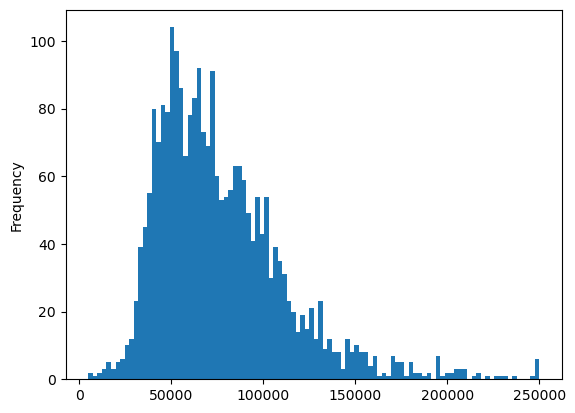

In [13]:
#relevant chart
incomedf['med_hh_income'].plot.hist(bins=100)

#### creating new dataframe merged variables of interests

In [14]:
#merging dataframe and geodataframe of census tracts
tracts_combined=tracts3.merge(df2,on="FIPS")
tracts_combined.info(verbose=True, show_counts=True)

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 2488 entries, 0 to 2487
Data columns (total 5 columns):
 #   Column                         Non-Null Count  Dtype   
---  ------                         --------------  -----   
 0   FIPS                           2488 non-null   object  
 1   Percentage_of_Without_Vehicle  2471 non-null   float64 
 2   geometry                       2488 non-null   geometry
 3   Population Over 65             2488 non-null   int64   
 4   Percent_of_Population_Over_65  2488 non-null   float64 
dtypes: float64(2), geometry(1), int64(1), object(1)
memory usage: 97.3+ KB


In [15]:
#merging another dataframe and geodataframe of census tracts
tracts_combined2=tracts_combined.merge(df4,on="FIPS")
tracts_combined2.info(verbose=True, show_counts=True)

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 2015 entries, 0 to 2014
Data columns (total 6 columns):
 #   Column                               Non-Null Count  Dtype   
---  ------                               --------------  -----   
 0   FIPS                                 2015 non-null   object  
 1   Percentage_of_Without_Vehicle        2000 non-null   float64 
 2   geometry                             2015 non-null   geometry
 3   Population Over 65                   2015 non-null   int64   
 4   Percent_of_Population_Over_65        2015 non-null   float64 
 5   Percentage_of_Public_Transportation  2015 non-null   float64 
dtypes: float64(3), geometry(1), int64(1), object(1)
memory usage: 94.6+ KB


In [16]:
incomedf['FIPS'] = incomedf ['tract']
#merging another dataframe and geodataframe of census tracts
tracts_combined3=tracts_combined2.merge(incomedf,on="FIPS")
tracts_combined3.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2015 entries, 0 to 2014
Data columns (total 20 columns):
 #   Column                               Non-Null Count  Dtype   
---  ------                               --------------  -----   
 0   FIPS                                 2015 non-null   object  
 1   Percentage_of_Without_Vehicle        2000 non-null   float64 
 2   geometry_x                           2015 non-null   geometry
 3   Population Over 65                   2015 non-null   int64   
 4   Percent_of_Population_Over_65        2015 non-null   float64 
 5   Percentage_of_Public_Transportation  2015 non-null   float64 
 6   tract                                2015 non-null   object  
 7   med_hh_income                        1991 non-null   float64 
 8   med_hh_income_universe               2015 non-null   int64   
 9   ami_category                         1991 non-null   object  
 10  below_med_income                     1991 non-null   object  
 11  below_60pct_med_i

### Maps and charts !

In [17]:
transit_desert_tracts_FIPS = ['6037231100',
                              '6037231220',
                              '6037231800',
                              '6037231720',
                              '6037231902',
                              '6037232120',
                              '6037232800',
                              '6037232702',
                              '6037239201',
                              '6037237102',
                              '6037239310',
                              '6037237600',
                              '6037239601',
                              '6037237710',
                              '6037239602',
                              '6037237720',
                              '6037239701',
                              '6037238310',
                              '6037239702',
                              '6037238320',
                              '6037240200',
                              '6037240301',
                              '6037240500',
                              '6037240401',
                              '6037240402',
                              '6037241201',
                              '6037241120',
                              '6037241202',
                              '6037241001',
                              '6037231710',
                              '6037232110',
                              '6037232701',
                              '6037237101',
                              '6037237500',
                              '6037231901',
                              '6037240302',
                              '6037241110',
                              '6037228420',
                              '6037228500',
                              '6037229300',
                              '6037229410',
                              '6037239202',
                              '6037239320',
                              '6037240010',
                              '6037240020',
                              '6037240600']
transit_desert_tracts_FIPS_0 = ['06037231100',
                               '06037231220',
                              '06037231800',
                              '06037231720',
                              '06037231902',
                              '06037232120',
                              '06037232800',
                              '06037232702',
                              '06037239201',
                              '06037237102',
                              '06037239310',
                              '06037237600',
                              '06037239601',
                              '06037237710',
                              '06037239602',
                              '06037237720',
                              '06037239701',
                              '06037238310',
                              '06037239702',
                              '06037238320',
                              '06037240200',
                              '06037240301',
                              '06037240500',
                              '06037240401',
                              '06037240402',
                              '06037241201',
                              '06037241120',
                              '06037241202',
                              '06037241001',
                              '06037231710',
                              '06037232110',
                              '06037232701',
                              '06037237101',
                              '06037237500',
                              '06037231901',
                              '06037240302',
                              '06037241110',
                              '06037228420',
                              '06037228500',
                              '06037229300',
                              '06037229410',
                              '06037239202',
                              '06037239320',
                              '06037240010',
                              '06037240020',
                              '06037240600']

# Filter the dataframe for rows where 'fips' column matches the FIPS codes list
desert_df2 = df2[df2['FIPS'].isin(transit_desert_tracts_FIPS_0)]
desert_df4 = df4[df4['FIPS'].isin(transit_desert_tracts_FIPS)]
desert_tracts3 = tracts3[tracts3['FIPS'].isin(transit_desert_tracts_FIPS)]
desert_combined = tracts_combined3[tracts_combined3['FIPS'].isin(transit_desert_tracts_FIPS_0)]

In [18]:
print(desert_combined.head())

            FIPS  Percentage_of_Without_Vehicle  \
649  06037228420                           13.2   
650  06037228500                            9.1   
658  06037229300                           15.3   
659  06037229410                            9.8   
661  06037231100                           26.8   

                                            geometry_x  Population Over 65  \
649  POLYGON ((-118.27402 34.01114, -118.27283 34.0...                 154   
650  POLYGON ((-118.27399 34.00383, -118.27263 34.0...                 287   
658  POLYGON ((-118.27398 34.00106, -118.27179 34.0...                 298   
659  POLYGON ((-118.27396 33.99523, -118.27177 33.9...                 233   
661  POLYGON ((-118.28277 34.01567, -118.28072 34.0...                 239   

     Percent_of_Population_Over_65  Percentage_of_Public_Transportation  \
649                            5.1                                12.66   
650                            5.3                                14.69   

/tmp/ipykernel_316/1341786546.py:51: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  bar3 = ax2.bar(index[-1], data1_means[-1], bar_width, color='darkorange')
/tmp/ipykernel_316/1341786546.py:52: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  bar4 = ax2.bar(index[-1] + bar_width, desert_data1_means[-1], bar_width, color='lightgreen')


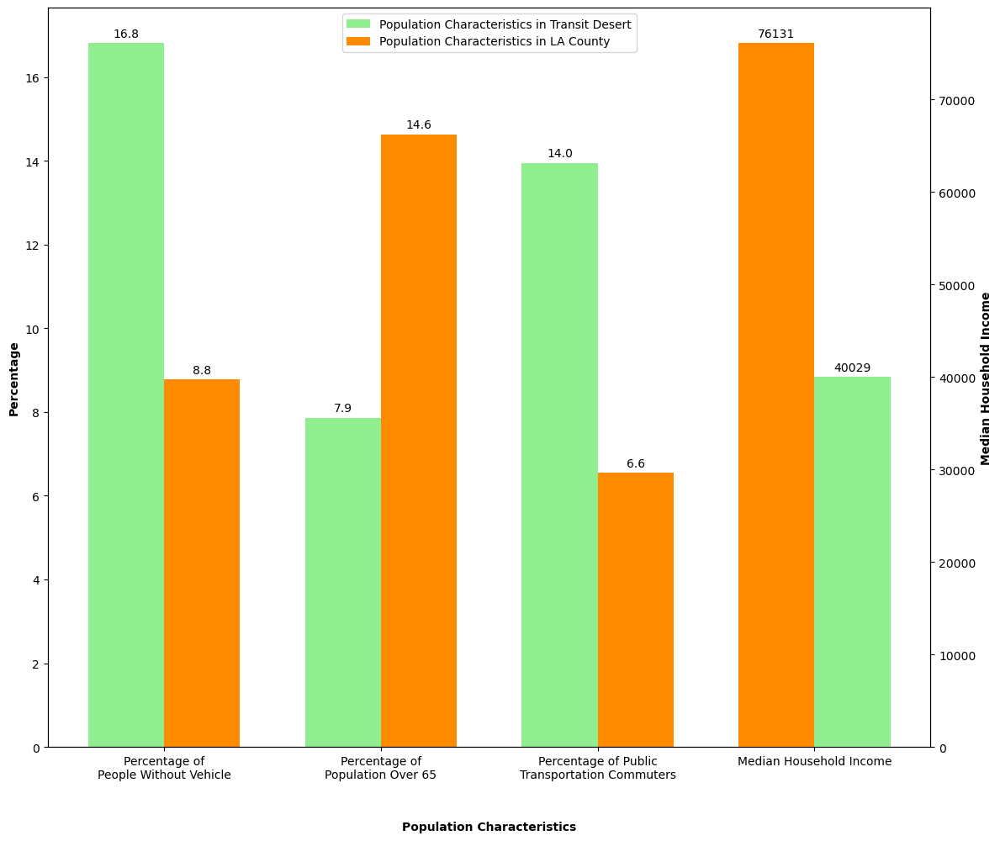

In [19]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

data1 = [
    'Percentage_of_Without_Vehicle',
    'Percent_of_Population_Over_65',
    'Percentage_of_Public_Transportation',
    'med_hh_income'
]

name1 = [
    'Percentage of\nPeople Without Vehicle',
    'Percentage of\nPopulation Over 65',
    'Percentage of Public\nTransportation Commuters',
    'Median Household Income'
]

desert_data1_means = desert_combined[data1].mean()
data1_means = tracts_combined3[data1].mean()

mean_df = pd.DataFrame({'data': data1_means, 'data1_desert': desert_data1_means})
n_groups = len(data1)
index = np.arange(n_groups)
bar_width = 0.35

fig, ax1 = plt.subplots(figsize=(12, 10))

# Plotting the green bars on the left
bar2 = ax1.bar(index[:-1], desert_data1_means[:-1], bar_width, label='Population Characteristics in Transit Desert', color='lightgreen')
# Plotting the orange bars on the right
bar1 = ax1.bar(index[:-1] + bar_width, data1_means[:-1], bar_width, label='Population Characteristics in LA County', color='darkorange')

ax1.set_xlabel('Population Characteristics', weight='bold')  # Set x-axis title in bold
ax1.set_ylabel('Percentage', weight='bold')
ax1.set_xticks(index[:-1] + bar_width / 2)
ax1.set_xticklabels(name1[:-1], rotation=0, ha='center')  # Set rotation to 0 for horizontal labels
ax1.legend()

for bar in bar1 + bar2:
    height = bar.get_height()
    ax1.annotate(f'{height:.1f}',
                 xy=(bar.get_x() + bar.get_width() / 2, height),
                 xytext=(0, 3),  # 3 points vertical offset
                 textcoords="offset points",
                 ha='center', va='bottom')

ax2 = ax1.twinx()
color = 'purple'

bar3 = ax2.bar(index[-1], data1_means[-1], bar_width, color='darkorange')
bar4 = ax2.bar(index[-1] + bar_width, desert_data1_means[-1], bar_width, color='lightgreen')

for bar in bar3.patches + bar4.patches:
    height = bar.get_height()
    ax2.annotate(f'{height:.0f}',
                 xy=(bar.get_x() + bar.get_width() / 2, height),
                 xytext=(0, 3),  # 3 points vertical offset
                 textcoords="offset points",
                 ha='center', va='bottom')

ax2.set_ylabel('Median Household Income', weight='bold')  # Set y-axis title in bold
ax1.set_xticks(index+bar_width/2)
ax1.set_xticklabels(name1, rotation=0, ha='center')  # Set rotation to 0 for horizontal labels

ax1.legend(loc='upper center')

# Adjust x-axis label position
ax1.xaxis.set_label_coords(0.5, -0.1)

fig.tight_layout()
plt.show()


In [20]:
data2 = [
    'below_60pct_med_income',
    'below_med_income',
    'below_moderate_income'
]

counts = tracts_combined3[data2].apply(lambda x: (x == 'Yes').sum())
counts_desert = desert_combined[data2].apply(lambda x: (x == 'Yes').sum())

percentages = counts / len(tracts_combined3) * 100
percentages_desert = counts_desert / len(desert_combined) * 100

print("Counts:\n", counts_desert)
print("\nPercentages:\n", percentages_desert)


Counts:
 below_60pct_med_income    34
below_med_income          40
below_moderate_income     40
dtype: int64

Percentages:
 below_60pct_med_income     85.0
below_med_income          100.0
below_moderate_income     100.0
dtype: float64


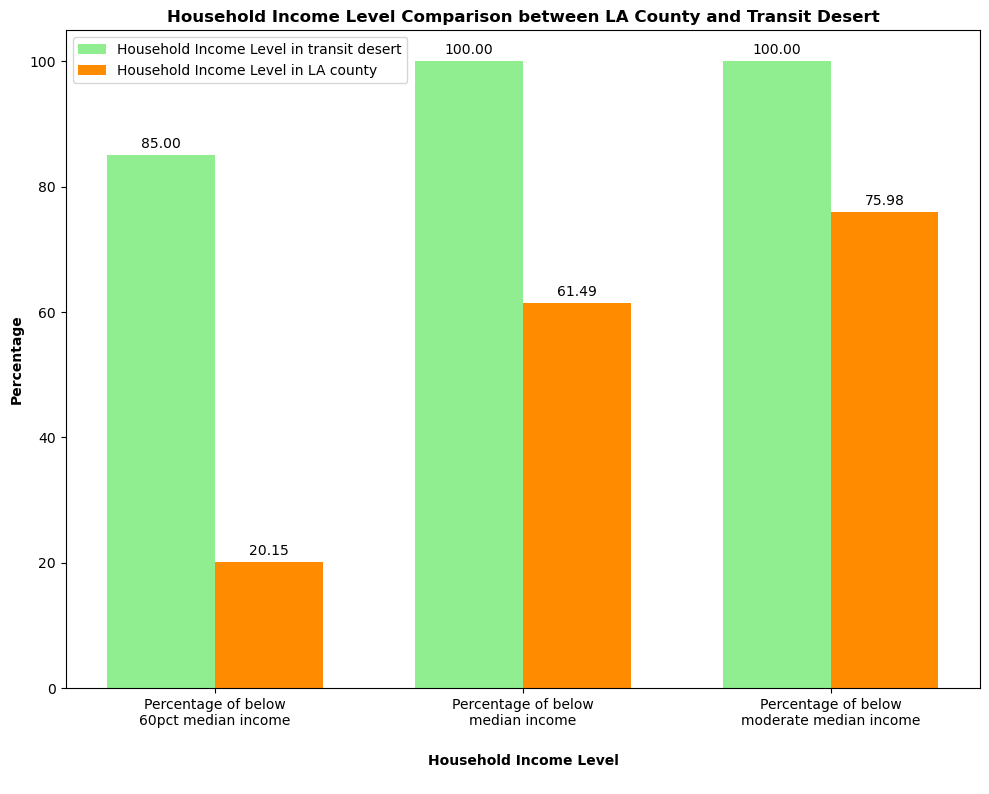

In [21]:
import matplotlib.pyplot as plt
import numpy as np

name2 = [
    'Percentage of below\n60pct median income',
    'Percentage of below\nmedian income',
    'Percentage of below\nmoderate median income'
]

# Create a DataFrame from the means
n_groups = len(data2)
index = np.arange(n_groups)
bar_width = 0.35

fig, ax = plt.subplots(figsize=(10, 8))

# Plotting the green bars on the left
bar2 = plt.bar(index, percentages_desert, bar_width, label='Household Income Level in transit desert', color='lightgreen')
# Plotting the orange bars on the right
bar1 = plt.bar(index + bar_width, percentages, bar_width, label='Household Income Level in LA county', color='darkorange')

# Adding value annotations above each bar
for bar in bar1 + bar2:
    height = bar.get_height()
    ax.annotate(f'{height:.2f}',
                xy=(bar.get_x() + bar.get_width() / 2, height),
                xytext=(0, 3),  # 3 points vertical offset
                textcoords="offset points",
                ha='center', va='bottom')

plt.xlabel('Household Income Level\n', weight='bold')  # Set x-axis label in bold with a space at the end
plt.ylabel('Percentage', weight='bold')
plt.title('Household Income Level Comparison between LA County and Transit Desert', weight='bold')
plt.xticks(index + bar_width / 2, name2, rotation=0, ha='center')  # Set rotation to 0 for horizontal labels
plt.legend()

# Adjust the position of the x-axis label to add space between the label and the axis
ax.xaxis.set_label_coords(0.5, -0.1)

plt.tight_layout()
plt.show()


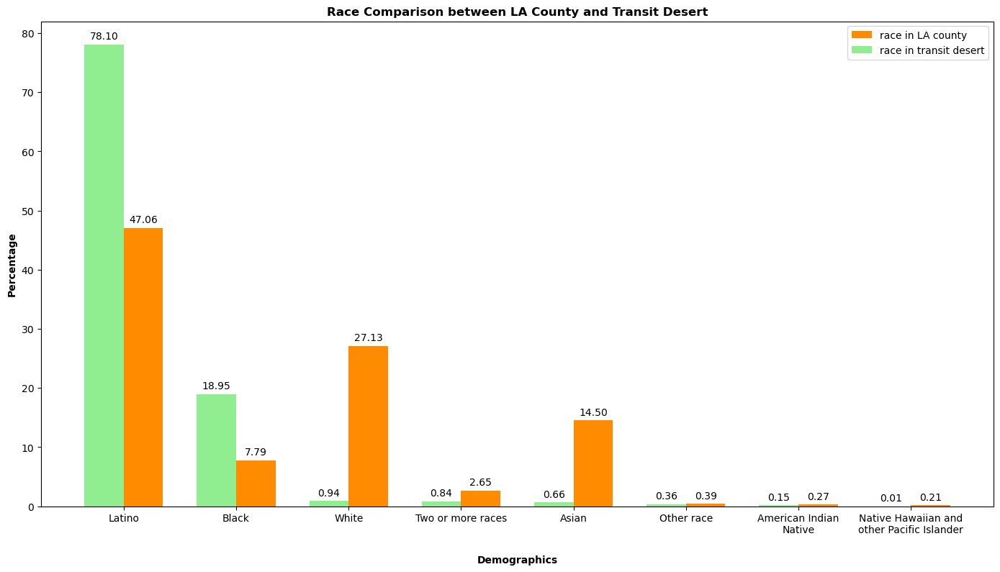

In [22]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

race_desert_df = pd.read_csv('https://drive.google.com/uc?export=download&id=16w6gciQknWRL5L74TNX63kb0YeIFoFXO', dtype={'FIPS': str})
race_df = pd.read_csv('https://drive.google.com/uc?export=download&id=17vxvt5SN_YkKLabyKESNAZI2qBLu8Az9', dtype={'FIPS': str})

columns = [
    'american_indian_native_pct',
    'asian_pct',
    'black_pct',
    'latino_pct',
    'native_hawaiian_other_pct',
    'other_race_pct',
    'pop_two_or_more_pct',
    'white_pct'
]

column = [
    'American Indian\nNative',
    'Asian',
    'Black',
    'Latino',
    'Native Hawaiian and\nother Pacific Islander',
    'Other race',
    'Two or more races',
    'White'
]

race_means = race_df[columns].mean()
race_desert_means = race_desert_df[columns].mean()

# Sort the mean values and corresponding labels by the green bars (race in transit desert)
sorted_means = sorted(zip(race_means, race_desert_means, column), key=lambda x: x[1], reverse=True)
sorted_race_means = [mean[0] for mean in sorted_means]
sorted_race_desert_means = [mean[1] for mean in sorted_means]
sorted_column = [mean[2] for mean in sorted_means]

# Create a DataFrame from the means
mean_df = pd.DataFrame({'race': sorted_race_means, 'race_desert': sorted_race_desert_means})
n_groups = len(columns)
index = np.arange(n_groups)
bar_width = 0.35

fig, ax = plt.subplots(figsize=(14, 8))

bar1 = plt.bar(index + bar_width, sorted_race_means, bar_width, label='race in LA county', color='darkorange')
bar2 = plt.bar(index, sorted_race_desert_means, bar_width, label='race in transit desert', color='lightgreen')

# Adding value annotations above each bar
for bar in bar1 + bar2:
    height = bar.get_height()
    ax.annotate(f'{height:.2f}',
                xy=(bar.get_x() + bar.get_width() / 2, height),
                xytext=(0, 3),  # 3 points vertical offset
                textcoords="offset points",
                ha='center', va='bottom')

plt.xlabel('Demographics', weight='bold')  # Set x-axis label in bold
plt.ylabel('Percentage', weight='bold')  # Set y-axis label in bold
plt.title('Race Comparison between LA County and Transit Desert', weight='bold')
plt.xticks(index + bar_width / 2, sorted_column, rotation=0, ha='center')  # Set rotation to 0 for horizontal labels
plt.legend()

# Adjust the position of the x-axis label to add space between the label and the axis
ax.xaxis.set_label_coords(0.5, -0.1)

plt.tight_layout()
plt.show()


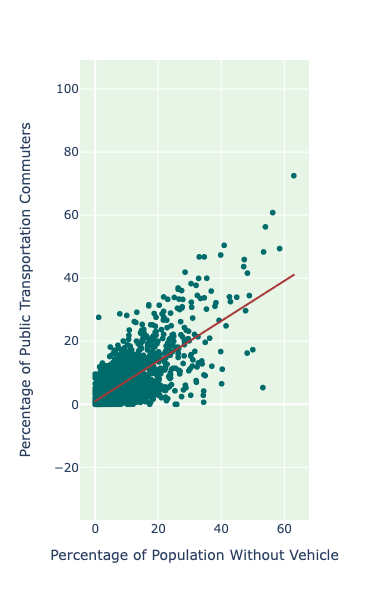

                                      px_fit_results
0  <statsmodels.regression.linear_model.Regressio...


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.507
Model:                            OLS   Adj. R-squared:                  0.507
Method:                 Least Squares   F-statistic:                     2054.
Date:                Mon, 18 Mar 2024   Prob (F-statistic):          3.82e-309
Time:                        07:51:54   Log-Likelihood:                -6153.3
No. Observations:                2000   AIC:                         1.231e+04
Df Residuals:                    1998   BIC:                         1.232e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.0181      0.170      5.984      0.000       0.684       1.352
x1             0.6356      0.014     45.326      0.000       0.608       0.663
==============================================================================
Omnibus:                      343.713   Durbin-Watson:                   1.918
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1591.960
Skew:                           0.745   Prob(JB):                         0.00
Kurtosis:                       7.109   Cond. No.                         17.6
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [75]:
import plotly.express as px

fig = px.scatter(tracts_combined2, x='Percentage_of_Without_Vehicle', y='Percentage_of_Public_Transportation', trendline="ols",
                 trendline_color_override='#a73838')

fig.update_traces(marker=dict(color='#006b6b'), selector=dict(mode='markers'))

fig.update_layout(
    plot_bgcolor='rgba(95,185,90,0.15)',
    autosize=False,
    width=600,
    height=600,
    xaxis=dict(
        title='Percentage of Population Without Vehicle',
        scaleanchor="y",
        scaleratio=1
    ),
    yaxis=dict(title='Percentage of Public Transportation Commuters')
)

fig.show()
fig.write_html("Percentage_of_Public_Transportation_Commuters.html")

results = px.get_trendline_results(fig)
print(results)
results.px_fit_results.iloc[0].summary()

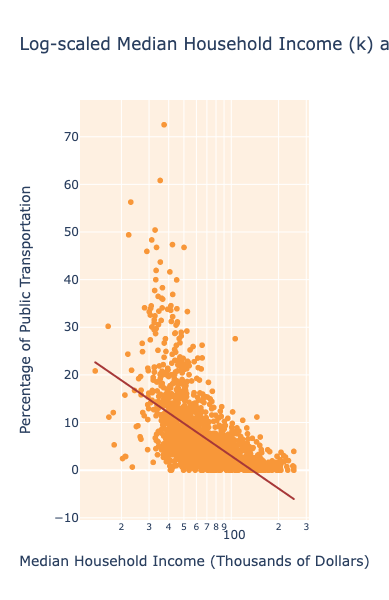

                                      px_fit_results
0  <statsmodels.regression.linear_model.Regressio...


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.328
Model:                            OLS   Adj. R-squared:                  0.327
Method:                 Least Squares   F-statistic:                     969.4
Date:                Mon, 18 Mar 2024   Prob (F-statistic):          1.03e-173
Time:                        07:52:48   Log-Likelihood:                -6436.2
No. Observations:                1991   AIC:                         1.288e+04
Df Residuals:                    1989   BIC:                         1.289e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         48.4187      1.350     35.877      0.000      45.772      51.065
x1           -22.7171      0.730    -31.136      0.000     -24.148     -21.286
==============================================================================
Omnibus:                     1146.386   Durbin-Watson:                   1.708
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            14733.676
Skew:                           2.461   Prob(JB):                         0.00
Kurtosis:                      15.385   Cond. No.                         23.4
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [76]:
import plotly.express as px

tracts_combined3['med_hh_income(k)'] = tracts_combined3['med_hh_income'] / 1000

fig = px.scatter(tracts_combined3, x='med_hh_income(k)', y='Percentage_of_Public_Transportation', log_x=True, trendline="ols", trendline_options=dict(log_x=True),
                 trendline_color_override='#a73838', title="Log-scaled Median Household Income (k) and log-transformed fit")

fig.update_traces(marker=dict(color='#f89739'), selector=dict(mode='markers'))

fig.update_layout(
    plot_bgcolor='rgba(248,151,57,0.15)',
    autosize=False,
    width=600,
    height=600,
    xaxis=dict(
        title='Median Household Income (Thousands of Dollars)',
        scaleanchor="y",
        scaleratio=1
    ),
    yaxis=dict(title='Percentage of Public Transportation')
)

fig.show()
fig.write_html("Median_Household_Income.html")

results = px.get_trendline_results(fig)
print(results)
results.px_fit_results.iloc[0].summary()

####plotting metro station and creating .5 mile buffers around each station

In [25]:
# importing data of metro stations locations
metro = gpd.read_file('Data/All_MetroRail_Stations.zip')
metro=metro.to_crs('EPSG:3857')

<Axes: >

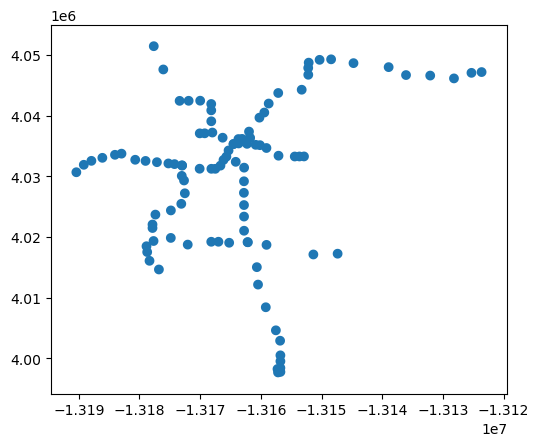

In [26]:
buffer_distance = 804
buffered_points = metro.geometry.buffer(buffer_distance)

buffered_points_gdf = gpd.GeoDataFrame(geometry=buffered_points)
buffered_points_gdf.plot()

####mapping the car ownership overlaying with metro stations

In [27]:
# Create a map of LA County with 'CartoDB positron' as the default basemap
la_county_bounds = [[33.703652, -118.468176], [34.337306, -117.955289]]
m = folium.Map(tiles='CartoDB positron')
m.fit_bounds(la_county_bounds)

# Plot census tracts and metro stations
tracts_combined.explore(
    m=m,
    column="Percentage_of_Without_Vehicle",
    scheme="NaturalBreaks",
    k=10,
    cmap="Oranges",
    legend=True,
    tooltip=False,
    popup=["Percentage_of_Without_Vehicle"],
    name="Percentage of Without Vehicle",
    style_kwds=dict(stroke=False)
)

buffered_points.explore(
    m=m,
    color="#5a80c1",
    marker_kwds=dict(radius=10, fill=True, fillColor="#5fb95a"),
    tooltip=False,
    name="Metro Stations",
    style_kwds=dict(stroke=False)
)

# Add layer control
folium.LayerControl().add_to(m)

# Save the map to an HTML file, plot map
m.save('Percentage_of_Without_Vehicle.html')
m

#### mapping the public transit commuters overlaying with metro stations

In [28]:
m = folium.Map(tiles='CartoDB positron')
m.fit_bounds(la_county_bounds)

# Visualize the percentage of public transportation commuters
tracts_combined2.explore(
    m=m,
    column="Percentage_of_Public_Transportation",
    scheme="quantiles",
    legend=True,
    k=10,
    cmap="Greens",
    tooltip=False,
    popup=["Percentage_of_Public_Transportation"],
    name="Percentage of Public Transportation",
    style_kwds=dict(stroke=False)
)

# Plot buffered points for metro stations, using green color and specified marker options
buffered_points.explore(
    m=m,
    color="#5a80c1",
    marker_kwds=dict(radius=5, fill=True),
    tooltip=False,
    name="Metro Stations",
    style_kwds=dict(stroke=False)
)

# Add layer control
folium.LayerControl().add_to(m)

# Save the map to an HTML file, plot map
m.save('Percentage_of_Public_Transportation.html')
m

#### mapping income

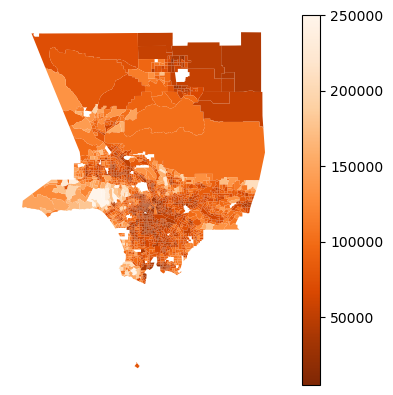

In [29]:
#first income map
norm = Normalize(vmin=incomedf['med_hh_income'].min(), vmax=incomedf['med_hh_income'].max())
fig, ax = plt.subplots()
incomedf.plot(ax=ax, column='med_hh_income', cmap='Oranges_r', norm=norm, legend=True)
ax.set_axis_off()


In [30]:
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.colors import ColorConverter

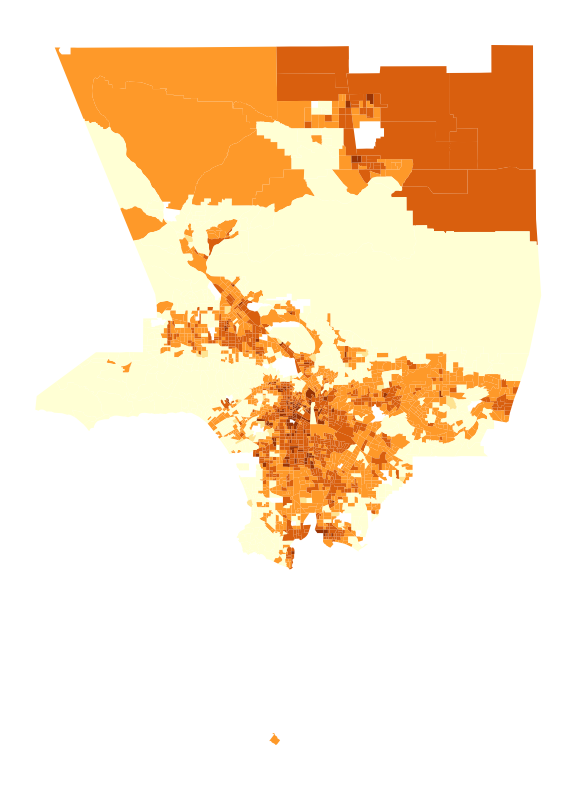

In [31]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import geopandas as gpd

# Define RGB colors
color1 = [255, 255, 212]
color2 = [254, 227, 145]
color3 = [254, 153, 41]
color4 = [217, 95, 14]
color5 = [153, 52, 4]
colors = [color1, color5, color3, color2, color4]

# Create colormap
cmap = mcolors.ListedColormap([[c[0]/255, c[1]/255, c[2]/255] for c in colors])

fig, ax = plt.subplots(figsize=(12, 10))
incomedf.plot(ax=ax, column='ami_category', cmap=cmap, legend=False, legend_kwds={'loc': 'lower center', 'fontsize': 8, 'markerscale': 0.5})
ax.set_axis_off()

plt.show()


In [32]:
#creating a function to create different binary maps accordung to different cut offs
income_category = {'below_med_income', 'below_60pct_med_income', 'below_moderate_income'}

def income_map_category(income_category):
    fig, ax = plt.subplots()
    incomedf.plot(ax=ax,
        figsize=(12, 10),
                 column= income_category,
                 legend=True,
                  cmap='YlOrBr',
                  legend_kwds={'loc': 'lower right'})
    if income_category=='below_med_income':
        a='below median income'
    if income_category=='below_60pct_med_income':
      a='below 60% median income'
    if income_category=='below_moderate_income':
      a='below moderate income'
    ax.set_title('Is the income '+str(a)+'?')
    ax.set_axis_off()

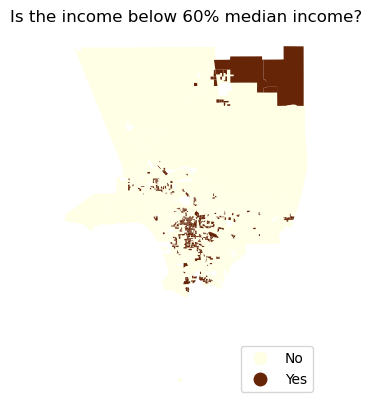

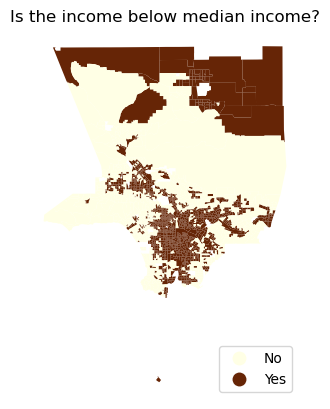

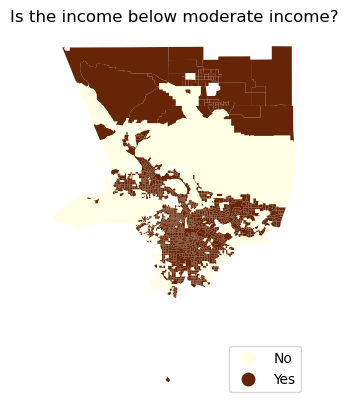

In [33]:
#call the funtion in a loop
for x in income_category:
    income_map_category(x)

In [34]:
m = folium.Map(tiles='CartoDB positron')
m.fit_bounds(la_county_bounds)

# Visualize median household income
incomedf.explore(
    m=m,
    column="med_hh_income",
    scheme="quantiles",
    legend=True,
    k=10,
    cmap="RdGy",
    tooltip=False,
    popup=["med_hh_income"],
    name="Median Household Income",
    style_kwds=dict(stroke=False)
)

# Plot buffered points for metro stations
buffered_points.explore(
    m=m,
    color="#5a80c1",
    marker_kwds=dict(radius=5, fill=True),
    tooltip=False,
    name="Metro Stations",
    style_kwds=dict(stroke=False)
)

# Add layer control
folium.LayerControl().add_to(m)

# Save the map
m.save('Median_Household_Income.html')
m

#### heat maps

/tmp/ipykernel_316/2673362363.py:5: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.

/tmp/ipykernel_316/2673362363.py:8: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.

/tmp/ipykernel_316/2673362363.py:11: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.



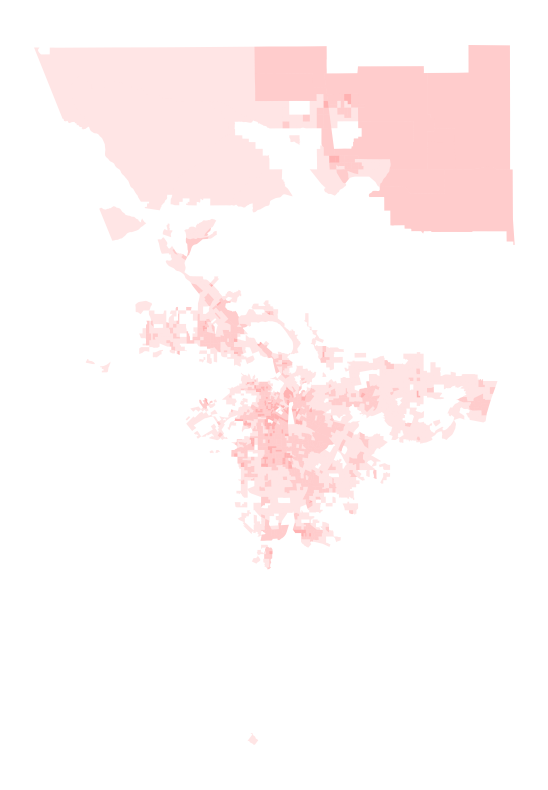

In [35]:
# heat map income without baseamap

fig, ax = plt.subplots(figsize=(12, 10))

incomedf[incomedf['ami_category']=='Low Income'].plot(ax=ax,
    column='ami_category', alpha=0.1, color='red')

incomedf[incomedf['ami_category']=='Very Low Income'].plot(ax=ax,
    column='ami_category', alpha=0.2, color='red')

incomedf[incomedf['ami_category']=='Extremely Low Income'].plot(ax=ax,
    column='ami_category', alpha=0.3, color='red')

ax.set_axis_off()
plt.show()


/tmp/ipykernel_316/850882444.py:5: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.

/tmp/ipykernel_316/850882444.py:8: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.

/tmp/ipykernel_316/850882444.py:11: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.



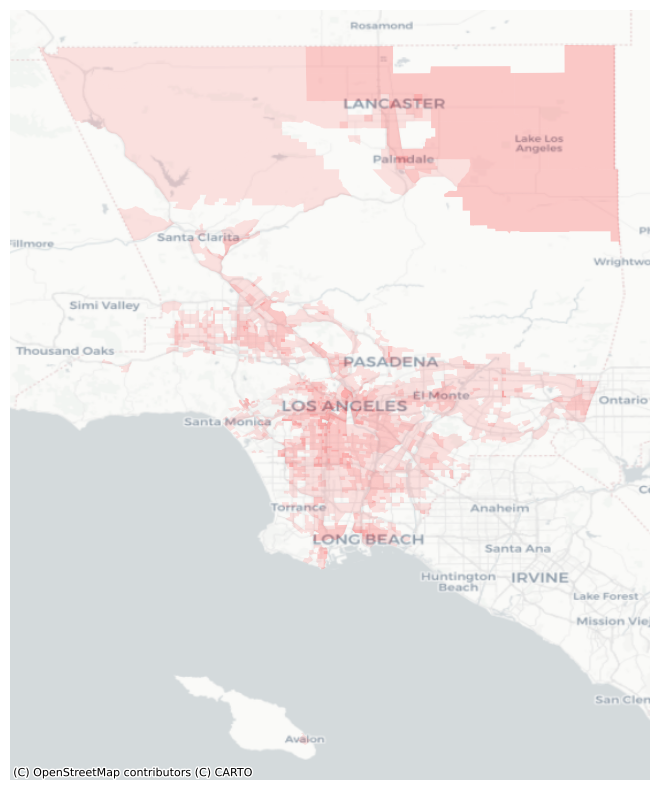

In [36]:
# prompt: Add a basemap to the previous map

fig, ax = plt.subplots(figsize=(12, 10))

incomedf[incomedf['ami_category']=='Low Income'].plot(ax=ax,
    column='ami_category', alpha=0.1, color='red')

incomedf[incomedf['ami_category']=='Very Low Income'].plot(ax=ax,
    column='ami_category', alpha=0.2, color='red')

incomedf[incomedf['ami_category']=='Extremely Low Income'].plot(ax=ax,
    column='ami_category', alpha=0.3, color='red')

ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs=incomedf.crs.to_string())

ax.set_axis_off()
plt.show()


/tmp/ipykernel_316/2700617025.py:4: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.

/tmp/ipykernel_316/2700617025.py:7: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.

/tmp/ipykernel_316/2700617025.py:10: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.



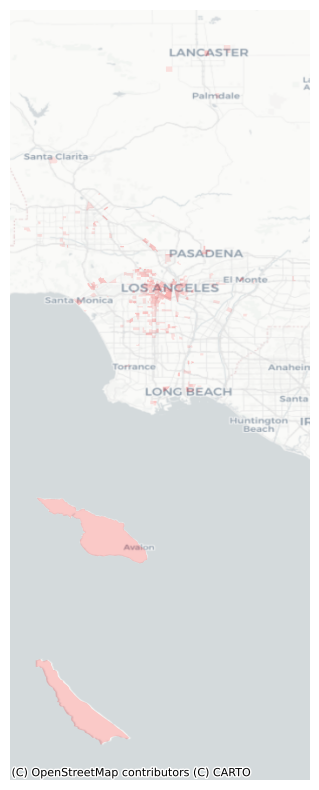

In [37]:
#Heat map car ownership
fig, ax = plt.subplots(figsize=(12, 10))

tracts_combined[tracts_combined['Percentage_of_Without_Vehicle']>=43].plot(ax=ax,
    column='Percentage_of_Without_Vehicle', alpha=0.1, color='red')

tracts_combined[tracts_combined['Percentage_of_Without_Vehicle']>=23].plot(ax=ax,
    column='Percentage_of_Without_Vehicle', alpha=0.1, color='red')

tracts_combined[tracts_combined['Percentage_of_Without_Vehicle']>=17].plot(ax=ax,
    column='Percentage_of_Without_Vehicle', alpha=0.1, color='red')
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs=incomedf.crs.to_string())
ax.set_axis_off()
plt.show()

/tmp/ipykernel_316/4283481713.py:4: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.

/tmp/ipykernel_316/4283481713.py:7: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.

/tmp/ipykernel_316/4283481713.py:10: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.



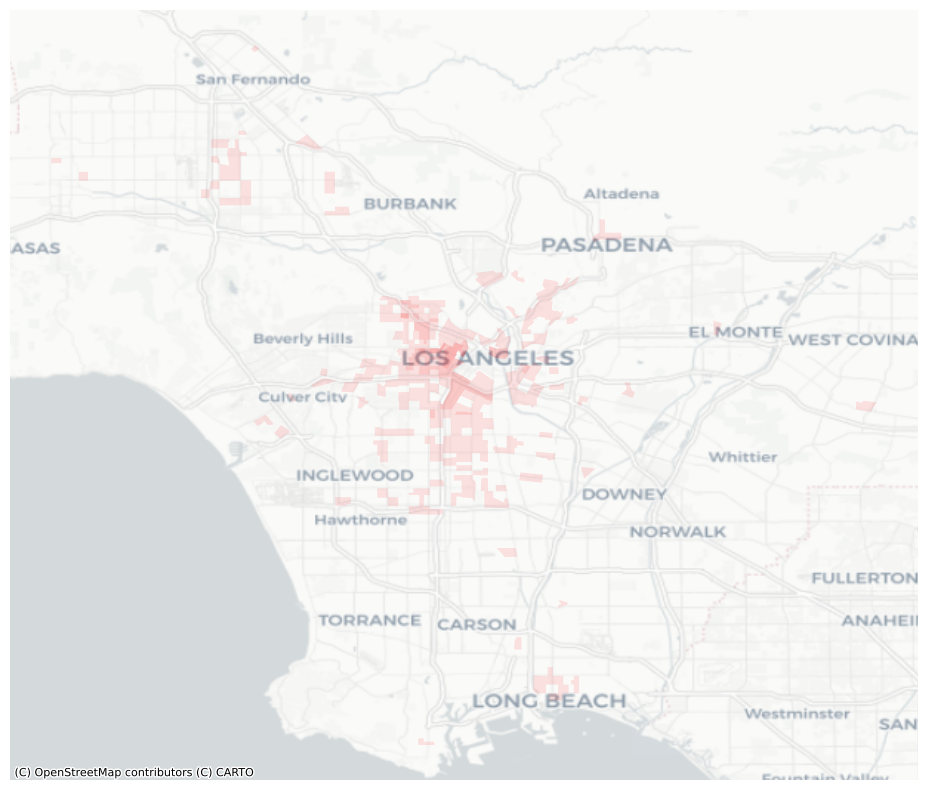

In [38]:
#Heatmap transit usage
fig, ax = plt.subplots(figsize=(12, 10))

tracts_combined2[tracts_combined2['Percentage_of_Public_Transportation']>=38].plot(ax=ax,
    column='Percentage_of_Public_Transportation', alpha=0.1, color='red')

tracts_combined2[tracts_combined2['Percentage_of_Public_Transportation']>=26].plot(ax=ax,
    column='Percentage_of_Public_Transportation', alpha=0.1, color='red')

tracts_combined2[tracts_combined2['Percentage_of_Public_Transportation']>=12].plot(ax=ax,
    column='Percentage_of_Public_Transportation', alpha=0.1, color='red')
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs=incomedf.crs.to_string())
ax.set_axis_off()
plt.show()

/tmp/ipykernel_316/1151074293.py:5: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.

/tmp/ipykernel_316/1151074293.py:8: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.

/tmp/ipykernel_316/1151074293.py:11: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.

/tmp/ipykernel_316/1151074293.py:14: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.

/tmp/ipykernel_316/1151074293.py:17: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.

/tmp/ipykernel_316/1151074293.py:20: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.

/tmp/ipykernel_316/1151074293.py:23: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.

/tmp/ipykernel_316/1151074293.py:26: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.

/tmp/ipykernel_316/1151074293.py:29: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.



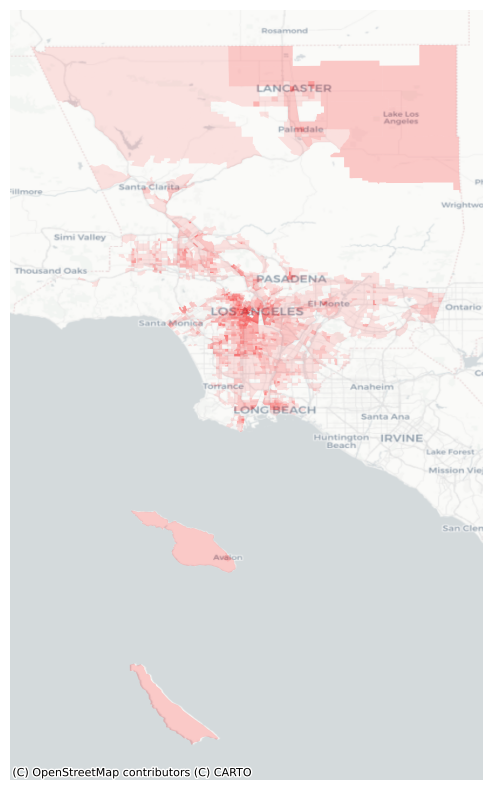

In [39]:
#Heatmap transit needs

fig, ax = plt.subplots(figsize=(12, 10))

incomedf[incomedf['ami_category']=='Low Income'].plot(ax=ax,
    column='ami_category', alpha=0.1, color='red')

incomedf[incomedf['ami_category']=='Very Low Income'].plot(ax=ax,
    column='ami_category', alpha=0.2, color='red')

incomedf[incomedf['ami_category']=='Extremely Low Income'].plot(ax=ax,
    column='ami_category', alpha=0.3, color='red')

tracts_combined[tracts_combined['Percentage_of_Without_Vehicle']>=43].plot(ax=ax,
    column='Percentage_of_Without_Vehicle', alpha=0.1, color='red')

tracts_combined[tracts_combined['Percentage_of_Without_Vehicle']>=23].plot(ax=ax,
    column='Percentage_of_Without_Vehicle', alpha=0.1, color='red')

tracts_combined[tracts_combined['Percentage_of_Without_Vehicle']>=17].plot(ax=ax,
    column='Percentage_of_Without_Vehicle', alpha=0.1, color='red')

tracts_combined2[tracts_combined2['Percentage_of_Public_Transportation']>=38].plot(ax=ax,
    column='Percentage_of_Public_Transportation', alpha=0.1, color='red')

tracts_combined2[tracts_combined2['Percentage_of_Public_Transportation']>=26].plot(ax=ax,
    column='Percentage_of_Public_Transportation', alpha=0.1, color='red')

tracts_combined2[tracts_combined2['Percentage_of_Public_Transportation']>=10].plot(ax=ax,
    column='Percentage_of_Public_Transportation', alpha=0.1, color='red')
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs=incomedf.crs.to_string())
ax.set_axis_off()
plt.show()



/tmp/ipykernel_316/153551171.py:3: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.

/tmp/ipykernel_316/153551171.py:6: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.

/tmp/ipykernel_316/153551171.py:9: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.

/tmp/ipykernel_316/153551171.py:12: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.

/tmp/ipykernel_316/153551171.py:15: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.

/tmp/ipykernel_316/153551171.py:18: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.

/tmp/ipykernel_316/153551171.py:21: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.

/tmp/ipykernel_316/153551171.py:24: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.

/tmp/ipykernel_316/153551171.py:27: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.



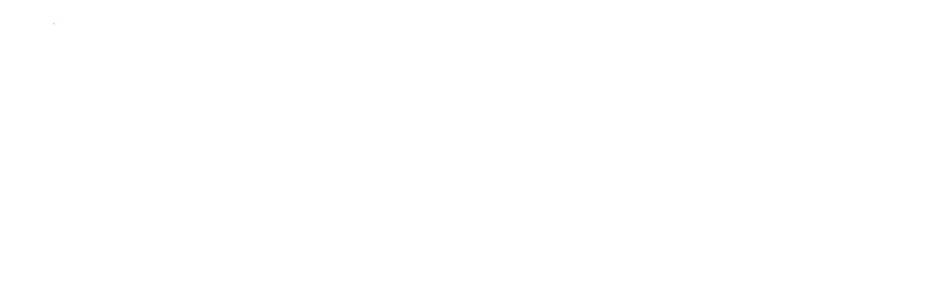

In [40]:
fig, ax = plt.subplots(figsize=(12, 10))

incomedf[incomedf['ami_category']=='Low Income'].plot(ax=ax,
    column='ami_category', alpha=0.1, color='red')

incomedf[incomedf['ami_category']=='Very Low Income'].plot(ax=ax,
    column='ami_category', alpha=0.2, color='red')

incomedf[incomedf['ami_category']=='Extremely Low Income'].plot(ax=ax,
    column='ami_category', alpha=0.3, color='red')

tracts_combined[tracts_combined['Percentage_of_Without_Vehicle']>=43].plot(ax=ax,
    column='Percentage_of_Without_Vehicle', alpha=0.1, color='red')

tracts_combined[tracts_combined['Percentage_of_Without_Vehicle']>=23].plot(ax=ax,
    column='Percentage_of_Without_Vehicle', alpha=0.1, color='red')

tracts_combined[tracts_combined['Percentage_of_Without_Vehicle']>=17].plot(ax=ax,
    column='Percentage_of_Without_Vehicle', alpha=0.1, color='red')

tracts_combined2[tracts_combined2['Percentage_of_Public_Transportation']>=38].plot(ax=ax,
    column='Percentage_of_Public_Transportation', alpha=0.1, color='red')

tracts_combined2[tracts_combined2['Percentage_of_Public_Transportation']>=26].plot(ax=ax,
    column='Percentage_of_Public_Transportation', alpha=0.1, color='red')

tracts_combined2[tracts_combined2['Percentage_of_Public_Transportation']>=10].plot(ax=ax,
    column='Percentage_of_Public_Transportation', alpha=0.1, color='red')

buffered_points.plot(ax=ax, color='green', alpha=0.6)

ax.set_axis_off()

plt.savefig('redmap.png', dpi=1000, bbox_inches='tight')
plt.show()


/tmp/ipykernel_316/61522878.py:3: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.

/tmp/ipykernel_316/61522878.py:6: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.

/tmp/ipykernel_316/61522878.py:9: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.

/tmp/ipykernel_316/61522878.py:12: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.

/tmp/ipykernel_316/61522878.py:15: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.

/tmp/ipykernel_316/61522878.py:18: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.

/tmp/ipykernel_316/61522878.py:21: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.

/tmp/ipykernel_316/61522878.py:24: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.

/tmp/ipykernel_316/61522878.py:27: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.



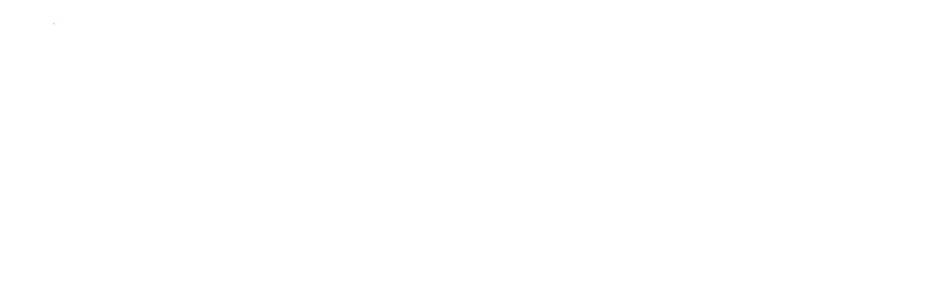

In [41]:
fig, ax = plt.subplots(figsize=(12, 10))

incomedf[incomedf['ami_category']=='Low Income'].plot(ax=ax,
    column='ami_category', alpha=0.2, color='red')

incomedf[incomedf['ami_category']=='Very Low Income'].plot(ax=ax,
    column='ami_category', alpha=0.4, color='red')

incomedf[incomedf['ami_category']=='Extremely Low Income'].plot(ax=ax,
    column='ami_category', alpha=0.6, color='red')

tracts_combined[tracts_combined['Percentage_of_Without_Vehicle']>=43].plot(ax=ax,
    column='Percentage_of_Without_Vehicle', alpha=0.2, color='red')

tracts_combined[tracts_combined['Percentage_of_Without_Vehicle']>=23].plot(ax=ax,
    column='Percentage_of_Without_Vehicle', alpha=0.2, color='red')

tracts_combined[tracts_combined['Percentage_of_Without_Vehicle']>=17].plot(ax=ax,
    column='Percentage_of_Without_Vehicle', alpha=0.2, color='red')

tracts_combined2[tracts_combined2['Percentage_of_Public_Transportation']>=38].plot(ax=ax,
    column='Percentage_of_Public_Transportation', alpha=0.2, color='red')

tracts_combined2[tracts_combined2['Percentage_of_Public_Transportation']>=26].plot(ax=ax,
    column='Percentage_of_Public_Transportation', alpha=0.2, color='red')

tracts_combined2[tracts_combined2['Percentage_of_Public_Transportation']>=10].plot(ax=ax,
    column='Percentage_of_Public_Transportation', alpha=0.2, color='red')

buffered_points.plot(ax=ax, color='green', alpha=0.6)

ax.set_axis_off()

plt.savefig('REDMAP.png', dpi=1000, bbox_inches='tight')
plt.show()


#### creating dataframe of transit desert corridor and mapping it

In [42]:
# listing the census tracts of the transit desert corridor (.5 mile from the FW110 (J-line))
transit_desert_tracts_FIPS = ['06037231100',
                              '06037231220',
                              '06037231800',
                              '06037231720',
                              '06037231902',
                              '06037232120',
                              '06037232800',
                              '06037232702',
                              '06037239201',
                              '06037237102',
                              '06037239310',
                              '06037237600',
                              '06037239601',
                              '06037237710',
                              '06037239602',
                              '06037237720',
                              '06037239701',
                              '06037238310',
                              '06037239702',
                              '06037238320',
                              '06037240200',
                              '06037240301',
                              '06037240500',
                              '06037240401',
                              '06037240402',
                              '06037241201',
                              '06037241120',
                              '06037241202',
                              '06037241001',
                              '06037231710',
                              '06037232110',
                              '06037232701',
                              '06037237101',
                              '06037237500',
                              '06037231901',
                              '06037240302',
                              '06037241110',
                              '06037228420',
                              '06037228500',
                              '06037229300',
                              '06037229410',
                              '06037239202',
                              '06037239320',
                              '06037240010',
                              '06037240020',
                              '06037240600']

In [43]:
transit_desert_tracts = tracts_combined.loc[tracts_combined["FIPS"].isin(transit_desert_tracts_FIPS)]
transit_desert_tracts.info(verbose=True, show_counts=True)

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 46 entries, 792 to 903
Data columns (total 5 columns):
 #   Column                         Non-Null Count  Dtype   
---  ------                         --------------  -----   
 0   FIPS                           46 non-null     object  
 1   Percentage_of_Without_Vehicle  46 non-null     float64 
 2   geometry                       46 non-null     geometry
 3   Population Over 65             46 non-null     int64   
 4   Percent_of_Population_Over_65  46 non-null     float64 
dtypes: float64(2), geometry(1), int64(1), object(1)
memory usage: 2.2+ KB


<Axes: >

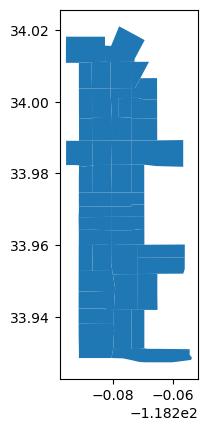

In [44]:
transit_desert_tracts.plot()

In [45]:
zoning = gpd.read_file('Data/zoningLAcity.zip')
zoning.info(verbose=True, show_counts=True)

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 59056 entries, 0 to 59055
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   ZONE_CMPLT  59056 non-null  object  
 1   PLNGDB_MNT  59056 non-null  int64   
 2   ZONE_CLASS  59056 non-null  object  
 3   ZONE_SMRY   58925 non-null  object  
 4   geometry    59056 non-null  geometry
dtypes: geometry(1), int64(1), object(3)
memory usage: 2.3+ MB


In [46]:
print("CRS: {}".format(zoning.crs))
print("CRS: {}".format(transit_desert_tracts.crs))

CRS: EPSG:2229
CRS: EPSG:4326


In [47]:
# Create a copy of the zoning shapefile
zoning_reproject_epsg = zoning.copy()

# Reproject the data
zoning_reproject_epsg = zoning_reproject_epsg.to_crs(epsg=4326)

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 2476 entries, 33104 to 58093
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   ZONE_CMPLT  2476 non-null   object  
 1   PLNGDB_MNT  2476 non-null   int64   
 2   ZONE_CLASS  2476 non-null   object  
 3   ZONE_SMRY   2476 non-null   object  
 4   geometry    2476 non-null   geometry
dtypes: geometry(1), int64(1), object(3)
memory usage: 116.1+ KB


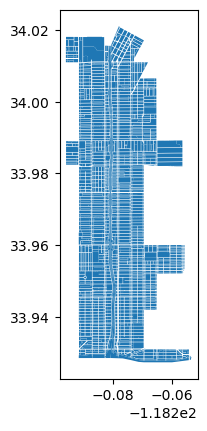

In [48]:
zoning_transit_desert_tracts_clip = gpd.clip(zoning_reproject_epsg, transit_desert_tracts)
zoning_transit_desert_tracts_clip.plot()
zoning_transit_desert_tracts_clip.info(verbose=True, show_counts=True)

In [49]:
#Renaming columns
zoning_transit_desert_tracts_clip.columns = ['ZONE_CMPLT',
                                             'PLNGDB_MNT',
                                             'ZONE_CLASS',
                                             'Landuse',
                                             'geometry']
columns_to_keep4 = ['Landuse',
                   'geometry',]
zoning_transit_desert_tracts_clip2 = zoning_transit_desert_tracts_clip[columns_to_keep4]

In [50]:
# get the counts of buildings by building type
zoning_transit_desert_tracts_clip_counts = zoning_transit_desert_tracts_clip.value_counts(['Landuse']).reset_index(name="count")
zoning_transit_desert_tracts_clip_counts

,Landuse,count
0,RESIDENTIAL,1246
1,COMMERCIAL,857
2,PUBLIC FACILITY,206
3,INDUSTRIAL,112
4,OPEN SPACE,54
5,PARKING,1


In [51]:
zoning_transit_desert_tracts_clip.loc[zoning_transit_desert_tracts_clip['Landuse']=='PARKING','Landuse'] = 'OPEN SPACE'

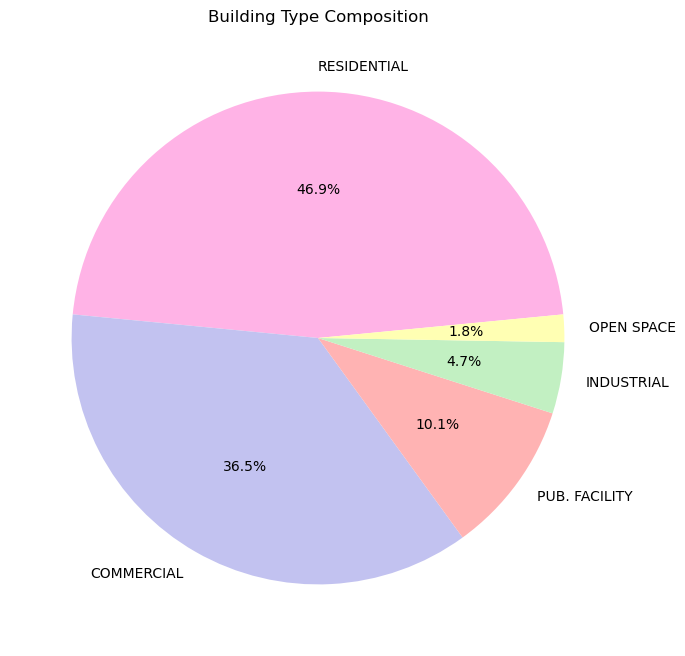

In [52]:
# Bldg. Type Composition
categories = ['RESIDENTIAL', 'COMMERCIAL', 'PUB. FACILITY', 'INDUSTRIAL', 'OPEN SPACE']
values = [783, 609, 168, 78, 30]

# Define a pastel color palette
colors = ['#ffb3e6', '#c2c2f0','#ffb3b3', '#c2f0c2', '#ffffb3']

# Calculate the starting angle to make 'RESIDENTIAL' start at 12 o'clock
total = sum(values)
cumulative_values = 0
for value in values:
    cumulative_values += value
    if categories[values.index(value)] == 'RESIDENTIAL':
        break
residential_angle = (cumulative_values - value/2) / total * 360
startangle = 90 - residential_angle

# Create the pie chart
plt.figure(figsize=(8, 8))  # Adjusts the figure size for better visibility
plt.pie(values, labels=categories, colors=colors, autopct='%1.1f%%', startangle=startangle)

plt.title('Building Type Composition')

# Display the plot
plt.show()

/tmp/ipykernel_316/3320451093.py:8: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.



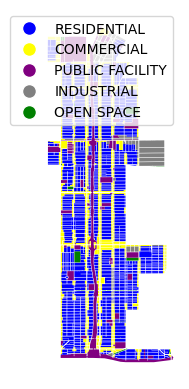

In [53]:
zoning_transit_desert_tracts_clip_dissolved = zoning_transit_desert_tracts_clip.dissolve(by='Landuse').reset_index()
zoning_transit_desert_tracts_clip_dissolved['count'] = zoning_transit_desert_tracts_clip.groupby('Landuse').size().reset_index(name='count')['count']

# Define the colors for each building type
colors = {'RESIDENTIAL': 'blue', 'COMMERCIAL': 'yellow', 'PUBLIC FACILITY': 'purple', 'INDUSTRIAL': 'grey', 'OPEN SPACE': 'green'}

# Plot the GeoDataFrame
ax = zoning_transit_desert_tracts_clip_dissolved.plot(column='Landuse', legend=False, color=[colors.get(x, 'white') for x in zoning_transit_desert_tracts_clip_dissolved['Landuse']])
# Create custom legend elements
legend_elements = [Line2D([0], [0], marker='o', color='w', label='RESIDENTIAL', markerfacecolor='blue', markersize=10),
                       Line2D([0], [0], marker='o', color='w', label='COMMERCIAL', markerfacecolor='yellow', markersize=10),
                       Line2D([0], [0], marker='o', color='w', label='PUBLIC FACILITY', markerfacecolor='purple', markersize=10),
                       Line2D([0], [0], marker='o', color='w', label='INDUSTRIAL', markerfacecolor='grey', markersize=10),
                       Line2D([0], [0], marker='o', color='w', label='OPEN SPACE', markerfacecolor='green', markersize=10)]

# Add the legend
ax.legend(handles=legend_elements, loc='upper right', bbox_to_anchor=(1, 1))

# Turn off the axis
ax.axis('off')
# Show the plot
plt.show()

In [54]:
import matplotlib as mpl
from matplotlib.colors import LinearSegmentedColormap, ListedColormap

m = zoning_transit_desert_tracts_clip.explore(
    column="Landuse",  # make choropleth based on "Landuse" column
    legend=True,  # show legend
    tooltip=False,  # hide tooltip
    popup=["Landuse"],  # show popup (on-click)
    legend_kwds=dict(colorbar=False),  # do not use colorbar
    name="Transit Desert Landuse",  # name of the layer in the map
    cmap=ListedColormap(["#f89739", "#bad647", "#006b6b", "#5fb95a","#5a80c1"]),
    style_kwds=dict(stroke=False)
)

folium.TileLayer("CartoDB positron", show=True).add_to(
    m
)  # use folium to add alternative tiles
folium.LayerControl().add_to(m)  # use folium to add layer control

m.save('Transit_Desert_Landuse.html')
m  # show map

### Mapping with indices

Indice for 'age'

In [55]:
# drop rows with null values for creating indices (for ‘age’)
df2 = df2.dropna() # dropna does not drop the row with 0. it drops data with na.
df2.shape

# Create a Quantiles Breaks classifier
classifier = mapclassify.Quantiles.make(k=5)

# Classify the data
classifications = df2[["Percent_of_Population_Over_65"]].apply(classifier)

# Let's see what we have
classifications.sample(5)

# Rename the column so that we know that it was classified with natural breaks
df2["Aging Score Data"] = df2[["Percent_of_Population_Over_65"]].apply(classifier)

df2['Aging Score(Aging Rate)'] = df2['Aging Score Data'].astype(str)
df2.loc[df2['Aging Score(Aging Rate)']=='0','Aging Score(Aging Rate)'] = '0: 0~9.8%'
df2.loc[df2['Aging Score(Aging Rate)']=='1','Aging Score(Aging Rate)'] = '1: 9.8~12.4%'
df2.loc[df2['Aging Score(Aging Rate)']=='2','Aging Score(Aging Rate)'] = '2: 12.4~15.2%'
df2.loc[df2['Aging Score(Aging Rate)']=='3','Aging Score(Aging Rate)'] = '3: 15.2~19.26%'
df2.loc[df2['Aging Score(Aging Rate)']=='4','Aging Score(Aging Rate)'] = '4: 19.26~48%'

mapclassify.Quantiles(y=df2["Percent_of_Population_Over_65"])

Quantiles

   Interval      Count
----------------------
[ 0.00,  9.80] |   505
( 9.80, 12.40] |   505
(12.40, 15.20] |   491
(15.20, 19.26] |   489
(19.26, 48.00] |   498

Indice for ‘public transit commute’

In [56]:
# drop rows with null values for creating indices
df4 = df4.dropna() # dropna does not drop the row with 0. it drops data with na.
df4.shape

# Create a Quantiles Breaks classifier
classifier = mapclassify.Quantiles.make(k=5)

# Classify the data
classifications = df4[["Percentage_of_Public_Transportation"]].apply(classifier)

# Let's see what we have
classifications.sample(5)

# Rename the column so that we know that it was classified with natural breaks
df4["Public Transit Commuter Score Data"] = df4[["Percentage_of_Public_Transportation"]].apply(classifier)

df4['Public Transit Commuter Score(Public Transit Commuter Rate)'] = df4['Public Transit Commuter Score Data'].astype(str)
df4.loc[df4['Public Transit Commuter Score(Public Transit Commuter Rate)']=='0','Public Transit Commuter Score(Public Transit Commuter Rate)'] = '0: 0~1.5%'
df4.loc[df4['Public Transit Commuter Score(Public Transit Commuter Rate)']=='1','Public Transit Commuter Score(Public Transit Commuter Rate)'] = '1: 1.5~3%'
df4.loc[df4['Public Transit Commuter Score(Public Transit Commuter Rate)']=='2','Public Transit Commuter Score(Public Transit Commuter Rate)'] = '2: 3~5.2%'
df4.loc[df4['Public Transit Commuter Score(Public Transit Commuter Rate)']=='3','Public Transit Commuter Score(Public Transit Commuter Rate)'] = '3: 5.2~9.7%'
df4.loc[df4['Public Transit Commuter Score(Public Transit Commuter Rate)']=='4','Public Transit Commuter Score(Public Transit Commuter Rate)'] = '4: 9.7~72.5%'

mapclassify.Quantiles(y=df4["Percentage_of_Public_Transportation"])

Quantiles

   Interval      Count
----------------------
[ 0.00,  1.48] |   471
( 1.48,  3.03] |   468
( 3.03,  5.17] |   469
( 5.17,  9.69] |   469
( 9.69, 72.52] |   469

Indice for ‘car ownership’

In [57]:
# drop rows with null values for creating indices
tracts3 = tracts3.dropna() # dropna does not drop the row with 0. it drops data with na.
tracts3.shape

# Classify the data
classifications = tracts3[["Percentage_of_Without_Vehicle"]].apply(classifier)

# Let's see what we have
classifications.sample(5)

# Rename the column so that we know that it was classified with natural breaks
tracts3["No Car Ownership Score Data"] = tracts3[["Percentage_of_Without_Vehicle"]].apply(classifier)

tracts3['No Car Ownership Score(No Car Ownership Rate)'] = tracts3['No Car Ownership Score Data'].astype(str)
tracts3.loc[tracts3['No Car Ownership Score(No Car Ownership Rate)']=='0','No Car Ownership Score(No Car Ownership Rate)'] = '0: 0~2.3%'
tracts3.loc[tracts3['No Car Ownership Score(No Car Ownership Rate)']=='1','No Car Ownership Score(No Car Ownership Rate)'] = '1: 2.3~4.6%'
tracts3.loc[tracts3['No Car Ownership Score(No Car Ownership Rate)']=='2','No Car Ownership Score(No Car Ownership Rate)'] = '2: 4.6~8.0%'
tracts3.loc[tracts3['No Car Ownership Score(No Car Ownership Rate)']=='3','No Car Ownership Score(No Car Ownership Rate)'] = '3: 8.0~13.6%'
tracts3.loc[tracts3['No Car Ownership Score(No Car Ownership Rate)']=='4','No Car Ownership Score(No Car Ownership Rate)'] = '4: 13.6~82.1%'

mapclassify.Quantiles(y=tracts3["P

SyntaxError: unterminated string literal (detected at line 21) (3815536405.py, line 21)

In [ ]:
incomedf.info(verbose=True, show_counts=True)

Indice for ‘Income'

In [ ]:
#creating new dataframe including data to be used
columns_to_keep4 = ['FIPS',
                   'med_hh_income']
incomedf2 = incomedf[columns_to_keep4]

# drop rows with null values
incomedf2 = incomedf2.dropna() # dropna does not drop the row with 0. it drops data with na.
incomedf2.shape

#reverse the order of income level
incomedf2.med_hh_income = incomedf2.med_hh_income*(-1)

mapclassify.Quantiles(y=incomedf2["med_hh_income"])

# Classify the data
classifications = incomedf2[["med_hh_income"]].apply(classifier)

# Let's see what we have
classifications.sample(5)

# Create a Natural Breaks classifier
classifier = mapclassify.Quantiles.make(k=5)

# Rename the column so that we know that it was classified with natural breaks
incomedf2["Low Income Score Data"] = incomedf2[["med_hh_income"]].apply(classifier)

incomedf2['Low Income Score(Medium Household Income)'] = incomedf2['Low Income Score Data'].astype(str)
incomedf2.loc[incomedf2['Low Income Score(Medium Household Income)']=='0','Low Income Score(Medium Household Income)'] = '0: $101,116<'
incomedf2.loc[incomedf2['Low Income Score(Medium Household Income)']=='1','Low Income Score(Medium Household Income)'] = '1: <$101,116'
incomedf2.loc[incomedf2['Low Income Score(Medium Household Income)']=='2','Low Income Score(Medium Household Income)'] = '2: <$78,544'
incomedf2.loc[incomedf2['Low Income Score(Medium Household Income)']=='3','Low Income Score(Medium Household Income)'] = '3: <$62,367'
incomedf2.loc[incomedf2['Low Income Score(Medium Household Income)']=='4','Low Income Score(Medium Household Income)'] = '4: <$48,265'

mapclassify.Quantiles(y=incomedf2["med_hh_income"])

Creating 'Transit Desert Index' combining indices above

In [ ]:
#merging dataframe and geodataframe of census tracts
tracts_combined=tracts3.merge(df2,on="FIPS")
tracts_combined3=tracts_combined.merge(incomedf2,on="FIPS")
tracts_combined2=tracts_combined3.merge(df4,on="FIPS")
tracts_combined2.info(verbose=True, show_counts=True)

In [ ]:
tracts_combined2['Transit Desert Index'] = tracts_combined2['Aging Score Data'] + tracts_combined2['Public Transit Commuter Score Data'] + tracts_combined2['No Car Ownership Score Data']+tracts_combined2['Low Income Score Data']
tracts_combined2.sample(5)

Mapping indices

In [ ]:
m = tracts_combined.explore(
    column="Aging Score(Aging Rate)",
    scheme="quantiles",  # use mapclassify's natural breaks scheme
    legend=True,  # show legend
    tooltip=False,  # hide tooltip
    popup=["Aging Score(Aging Rate)"],  # show popup (on-click)
    legend_kwds=dict(colorbar=False),  # do not use colorbar
    name="Aging Score(Aging Rate)",  # name of the layer in the map
    cmap="Blues",
    style_kwds=dict(stroke=False),
)

folium.TileLayer("CartoDB positron", show=True).add_to(
    m
)  # use folium to add alternative tiles
folium.LayerControl().add_to(m)  # use folium to add layer control

m.save('Aging_Score.html')
m  # show map

In [ ]:
m = tracts_combined.explore(
    column="No Car Ownership Score(No Car Ownership Rate)",
    scheme="quantiles",  # use mapclassify's natural breaks scheme
    legend=True,  # show legend
    tooltip=False,  # hide tooltip
    popup=["No Car Ownership Score(No Car Ownership Rate)"],  # show popup (on-click)
    legend_kwds=dict(colorbar=False),  # do not use colorbar
    name="No Car Ownership Score(No Car Ownership Rate)",  # name of the layer in the map
    cmap="Oranges",
    style_kwds=dict(stroke=False),    
    )

folium.TileLayer("CartoDB positron", show=True).add_to(
    m
)  # use folium to add alternative tiles
folium.LayerControl().add_to(m)  # use folium to add layer control

m.save('No_Car_Ownership_Score.html')
m  # show map

In [ ]:
m = tracts_combined2.explore(
    column="Public Transit Commuter Score(Public Transit Commuter Rate)",
    scheme="quantiles",  # use mapclassify's natural breaks scheme
    k=5,  # use 5 bins
    legend=True,  # show legend
    tooltip=False,  # hide tooltip
    popup=["Public Transit Commuter Score(Public Transit Commuter Rate)"],  # show popup (on-click)
    legend_kwds=dict(colorbar=False),  # do not use colorbar
    name="Public Transit Commuter Score(Public Transit Commuter Rate)",  # name of the layer in the map
    cmap="Greens",
    style_kwds=dict(stroke=False),    
)

folium.TileLayer("CartoDB positron", show=True).add_to(
    m
)  # use folium to add alternative tiles
folium.LayerControl().add_to(m)  # use folium to add layer control

m.save('Public_Transit_Commuter_Score.html')
m  # show map

In [ ]:
m = tracts_combined3.explore(
    column="Low Income Score(Medium Household Income)",
    scheme="naturalbreaks",  # use mapclassify's natural breaks scheme
    legend=True,  # show legend
    tooltip=False,  # hide tooltip
    popup=["Low Income Score(Medium Household Income)"],  # show popup (on-click)
    legend_kwds=dict(colorbar=False),  # do not use colorbar
    name="Low Income Score(Medium Household Income)",  # name of the layer in the map
    cmap="RdGy_r",
    style_kwds=dict(stroke=False),
)

folium.TileLayer("CartoDB positron", show=True).add_to(
    m
)  # use folium to add alternative tiles
folium.LayerControl().add_to(m)  # use folium to add layer control

m.save('Low_Income_Score.html')
m  # show map

In [ ]:
m = tracts_combined2.explore(
    column="Transit Desert Index",
    scheme="quantiles",  # use mapclassify's natural breaks scheme
    k=5,  # use 5 bins
    legend=True,  # show legend
    tooltip=False,  # hide tooltip
    popup=["Transit Desert Index"],  # show popup (on-click)
    legend_kwds=dict(colorbar=False),  # do not use colorbar
    name="Transit Desert Index",  # name of the layer in the map
    cmap="YlOrBr",
    style_kwds=dict(stroke=False), 
)

buffered_points.explore( #”metro” is the dataframe of metro stations’ points
    m=m,  # pass the map object
    color="5a88c1",  # use red color on all points
    marker_kwds=dict(radius=5, fill=True),  # make marker radius 10px with fill
    tooltip=False,  # hide tooltip
    tooltip_kwds=dict(labels=False),  # do not show column label in the tooltip
    name="metro stations",  # name of the layer in the map
)

folium.TileLayer("CartoDB positron", show=True).add_to(
    m
)  # use folium to add alternative tiles
folium.LayerControl().add_to(m)  # use folium to add layer control

m.save('Transit_Desert_Index.html')
m  # show map

### Analysis
Based on our different maps and charts, we observe that there is a correlation between income and the stations' locations. These areas also tend to show a lower percentage of car ownership.
Given the litteratue on the topic, this makes sense because the people who tend to use transit the most are the carless and the less afluent.
Basing ourselves on one of our project assumption which states that the rail transportation is considered by riders as more comfortable than the bus and an indicator of public authorities effort and interst to provide people with quality means of transportation, we identify the area along the Harbour Freeway between the Exposition Park and Athens as a critical area in need of more transit investments as it shows a high proportion of Extremely and Very low income housholds as well as a low car ownership rate.
We acknowledge that the area is already served by BRT but suggest that having a rail line over the corridor can enhance the comfort of the transit dependent people that live in the area.

Finally, our goal for the next days is to try to conduct statistical analysis of the areas that lie in the corridors and to compare it with the areas outside in order to compare the social characteristics and be able to identify any existing or non existing discrepancy.

#### Group Members
- Alain Jabbour: analyzing househould incomes  
- Simon Han: analyzing car ownership  
- Tomohiro Ujikawa: managing assignments submission and analyzing older population, transit commuter and car ownership  
- Xinyi Cao: analyzing gross rent changes and using regression analysis